In [3]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # 메모리 사용 제한을 위한 설정
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        # 특정 GPU만 사용하도록 설정
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
    except RuntimeError as e:
        # 프로그램 시작 후에는 GPU 설정을 변경할 수 없으므로
        # 런타임 오류 발생 시 예외 처리가 필요함
        print(e)

## 14-1. 프로젝트 : Segmentation map으로 도로 이미지 만들기

이전 Pix2Pix 논문에서 제시한 결과 중에 아래와 같은 실험 결과가 있었습니다. 도로의 레이블 정보를 활용해 이미지를 생성해낸 결과입니다.

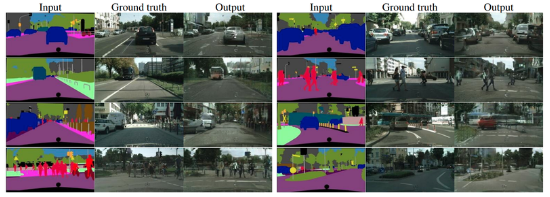

이번 프로젝트는 위와 같은 데이터셋을 이용해 Pix2Pix를 학습시켜보는 것입니다. 데이터셋은 아래에서 다운로드할 수 있습니다.
1000개의 학습용 이미지 및 5개의 평가 이미지를 포함합니다.

[cityscapes.zip](https://d3s0tskafalll9.cloudfront.net/media/documents/cityscapes.zip)

이전 포켓몬 데이터에서 사용했던 스케치와는 조금 다른 레이블 정보 이미지를 입력으로 사용하기 때문에, 전처리 과정에 대해 약간의 혼란이 있을 수 있지만 크게 다른 과정은 없습니다.
아래 Tensroflow에서 제공하는 Pix2Pix 튜토리얼은 위 이미지와 비슷한 레이블 정보 이미지를 사용하기 때문에 좋은 참고 자료가 될 수 있을 것 같습니다.

프로젝트 시작에 어려움이 있다면 아래 튜토리얼을 참고하시면서 이번 프로젝트를 수행해 봅시다.
(아래 튜토리얼은 Pix2Pix 구조를 Functional API를 이용해 구현하기 때문에 이번에 진행한 Subclassing 방법을 이용한 모델 구현과 비교하면서 구현 방법에 대해서도 공부해 보시길 추천드립니다)

- [Tensorflow Pix2Pix Tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix?hl=ko)

프로젝트를 수행하기 전에 주요 라이브러리 버전을 살펴 봅시다.

In [4]:
import numpy
import tensorflow

print(numpy.__version__)
print(tensorflow.__version__)

1.21.4
2.6.0


In [5]:
import os

# 데이터 경로 설정 및 훈련 예제의 수 출력
data_path = os.getenv('HOME')+'/aiffel/conditional_generation/data/cityscapes/train/'
print("number of train examples :", len(os.listdir(data_path)))

number of train examples : 1000


In [46]:
# 검증용 데이터셋 확인
data_path_val = os.getenv('HOME')+'/aiffel/conditional_generation/data/cityscapes/val/'
print("number of val examples :", len(os.listdir(data_path_val)))

number of val examples : 5


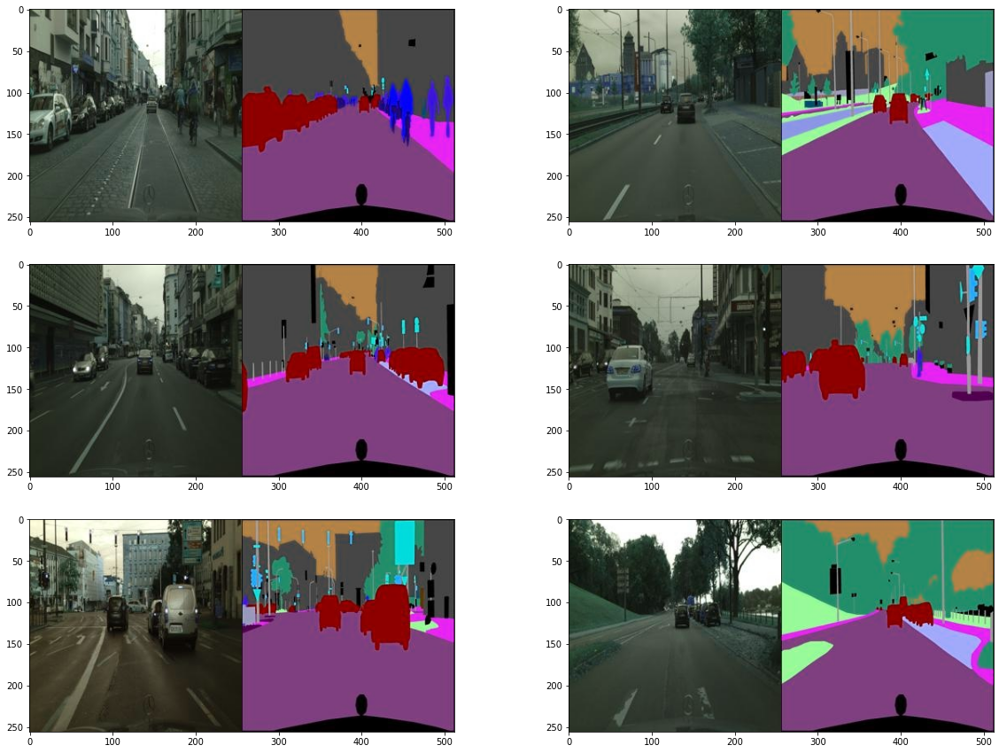

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 훈련 데이터에서 임의의 이미지 6개를 선택하여 시각화
# 하나의 이미지에 Segmentation Image와 실제 이미지가 존재함을 확인 할 수 있습니다.
plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(800)]  # 무작위로 이미지 파일 선택
    img = cv2.imread(f, cv2.IMREAD_COLOR)  # 이미지 읽기
    plt.subplot(3,2,i)  # 서브플롯 설정
    plt.imshow(img)  # 이미지 표시

In [7]:
# 이미지의 차원 확인
f = data_path + os.listdir(data_path)[0]  # 첫 번째 이미지 파일
img = cv2.imread(f, cv2.IMREAD_COLOR)  # 이미지 읽기
print(img.shape)  # 이미지 차원 출력

(256, 512, 3)


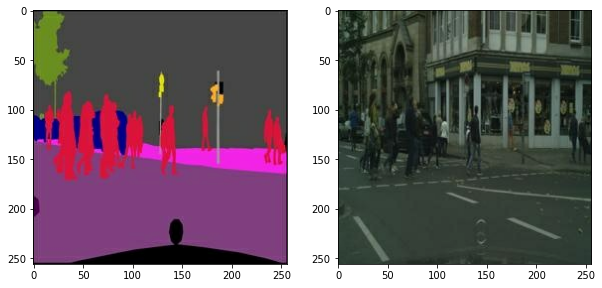

In [8]:
import tensorflow as tf

# (256, 512, 3) 크기의 이미지안에 두개의 이미지가 붙어있으므로 
# (256,256,3)으로 분할하여 사용합니다.

# 이미지 정규화 함수
def normalize(x):
    x = tf.cast(x, tf.float32)  # 타입 변환
    return (x/127.5) - 1  # 정규화

# 이미지 역정규화 함수
def denormalize(x):
    x = (x+1)*127.5  # 역정규화
    x = x.numpy()  # 넘파이 배열로 변환
    return x.astype(np.uint8)  # uint8 타입으로 변환

# 이미지 로딩 및 분리 함수
def load_img(img_path):
    img = tf.io.read_file(img_path)  # 파일 읽기
    img = tf.image.decode_image(img, 3)  # 이미지 디코딩
    
    w = tf.shape(img)[1] // 2  # 이미지 너비의 절반 계산
    sketch = img[:, w:, :]  # 스케치 부분 추출
    sketch = tf.cast(sketch, tf.float32)  # 타입 변환
    colored = img[:, :w, :]  # 채색 부분 추출
    colored = tf.cast(colored, tf.float32)  # 타입 변환
    return normalize(sketch), normalize(colored)  # 정규화된 스케치와 채색 반환

# 이미지 로딩 및 시각화
f = data_path + os.listdir(data_path)[3]  # 두 번째 이미지 파일
sketch, colored = load_img(f)  # 이미지 로딩 및 분리

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))  # 스케치 시각화
plt.subplot(1,2,2); plt.imshow(denormalize(colored))  # 채색 부분 시각화

In [9]:
# 데이터의 다양성을 높이기 위하여 augmentation 함수를 적용하여 이미지를 증강하여 줍니다.
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

# 이미지 증강 함수
@tf.function() 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)  # 스케치와 채색 부분 결합
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])  # 패딩 설정
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")  # 반사 패딩 적용
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)  # 일정값 패딩 적용

    out = image.random_crop(padded, size=[256, 256, 6])  # 무작위 크롭
    
    out = image.random_flip_left_right(out)  # 좌우 반전
    out = image.random_flip_up_down(out)  # 상하 반전
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)  # 무작위 회전 각도 설정
        out = image.rot90(out, k=degree)  # 회전 적용
    
    return out[...,:3], out[...,3:]  # 스케치와 채색 부분 분리하여 반환

print("✅")

✅


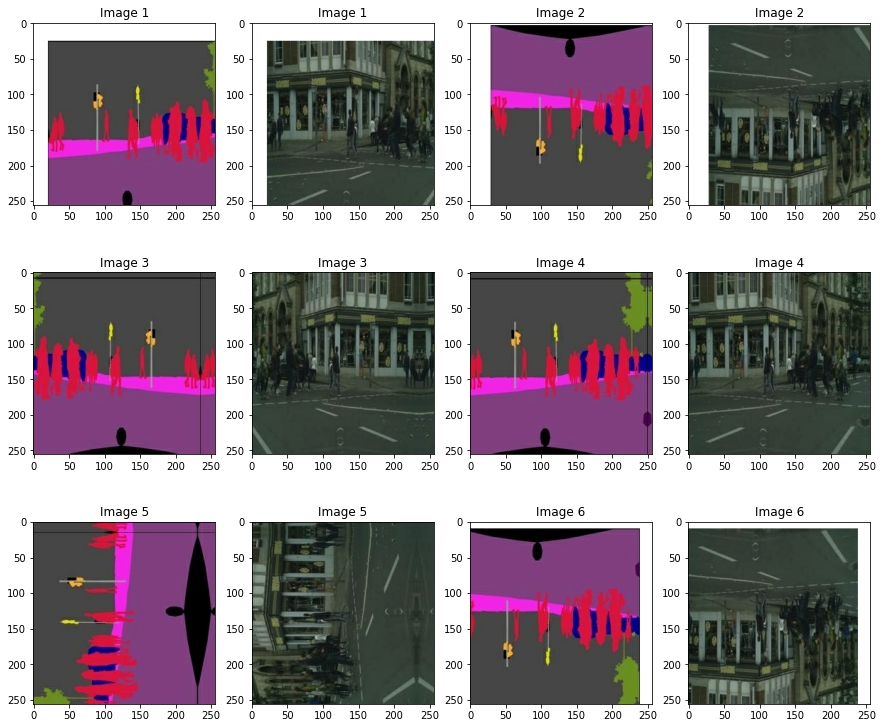

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# 이미지 증강 적용 후 시각화를 위한 설정
plt.figure(figsize=(15,13))
img_n = 1  # 이미지 번호 초기화
for i in range(1, 13, 2):
    # 스케치와 채색 이미지에 이미지 증강 적용
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
    # 증강된 스케치 이미지 시각화
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    # 증강된 채색 이미지 시각화
    plt.subplot(3,4,i+1)
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1  # 이미지 번호 증가

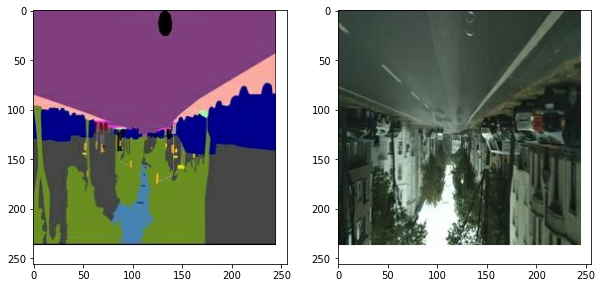

In [11]:
from tensorflow import data

# 훈련 데이터 로드 및 전처리 함수
def get_train(img_path):
    sketch, colored = load_img(img_path)  # 이미지 로드
    sketch, colored = apply_augmentation(sketch, colored)  # 이미지 증강 적용
    return sketch, colored  # 전처리된 이미지 반환

# 훈련 이미지 데이터셋 설정
train_images = data.Dataset.list_files(data_path + "*.jpg")  # 이미지 파일 경로 목록 생성
train_images = train_images.map(get_train).shuffle(100).batch(4)  # 데이터셋 매핑, 셔플, 배치 적용

# 샘플 데이터 추출 및 시각화
sample = train_images.take(1)  # 데이터셋에서 하나의 배치 추출
sample = list(sample.as_numpy_iterator())  # 넘파이 배열로 변환
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5  # 역정규화

# 샘플 스케치 및 채색 이미지 시각화
plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))  # 스케치 이미지
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))  # 채색 이미지

## 14-2. U-Net Generator, discriminator을 이용한 모델 구현
### Generator 구현하기

In [12]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn  # Batch Normalization 사용 여부
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)  # Conv2D 레이어 생성
        self.batchnorm = layers.BatchNormalization()  # BatchNormalization 레이어 생성
        self.lrelu= layers.LeakyReLU(0.2)  # LeakyReLU 활성화 함수 적용

    def call(self, x):
        x = self.conv(x)  # Conv2D 적용
        if self.use_bn:
            x = self.batchnorm(x)  # BatchNormalization 적용
        return self.lrelu(x)  # LeakyReLU 적용

print("✅")

✅


In [13]:
class Encoder(layers.Layer):
    def __init__(self):
        super(Encoder, self).__init__()
        filters = [64,128,256,512,512,512,512,512]  # 각 블록의 필터 수

        # for문과 리스트 filter를 활용해서 EncoderBlock을 쌓아주세요.
        # 조건 1. 첫번째 EncoderBlock의 경우 Batch Normalization을 생략해주세요.

        # EncoderBlock을 쌓습니다.
        self.blocks = [] 
        for i, f in enumerate(filters):
            # 첫 번째 블록은 Batch Normalization 생략
            self.blocks.append(EncodeBlock(f, use_bn=i!=0))
    
    def call(self, x):
        for block in self.blocks:
            x = block(x)  # 각 블록을 순차적으로 적용
        return x
    
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


In [14]:
Encoder().get_summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
encode_block (EncodeBlock)   (None, 128, 128, 64)      3072      
_________________________________________________________________
encode_block_1 (EncodeBlock) (None, 64, 64, 128)       131584    
_________________________________________________________________
encode_block_2 (EncodeBlock) (None, 32, 32, 256)       525312    
_________________________________________________________________
encode_block_3 (EncodeBlock) (None, 16, 16, 512)       2099200   
_________________________________________________________________
encode_block_4 (EncodeBlock) (None, 8, 8, 512)         4196352   
_________________________________________________________________
encode_block_5 (EncodeBlock) (None, 4, 4, 512)         419635

In [15]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout  # Dropout 사용 여부
        
        # Conv2DTranspose 레이어 생성
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)  
        self.batchnorm = layers.BatchNormalization()  # BatchNormalization 레이어 생성
        self.relu = layers.ReLU()  # ReLU 활성화 함수 적용
        
    def call(self, x):
        x = self.Transconv(x)  # Conv2DTranspose 적용
        x = self.batchnorm(x)  # BatchNormalization 적용
        if self.dropout:
            x = layers.Dropout(.5)(x)  # Dropout 적용
        return self.relu(x)  # ReLU 적용

In [16]:
class Decoder(layers.Layer):
    def __init__(self):
        super(Decoder, self).__init__()
        filters = [512,512,512,512,256,128,64]  # 각 블록의 필터 수
        
        # for문을 이용해서 모델을 쌓아주세요.
        # 조건 1. 3번째 block까지는 Dropout을 사용하되 그 이후에는 Dropout을 사용하지 마세요.
        # for문이 끝난 다음 Conv2DTranspose를 쌓아주되 output 차원수는 3, 
        # filter 사이즈는 4, stride는 2로 구성해주시고 자동 패딩 적용해주시되 bias는 사용하지 않습니다.
        
        self.blocks = []
        for i, f in enumerate(filters):
            self.blocks.append(DecodeBlock(f, dropout=i<3))  # 첫 3개 블록에만 Dropout 적용
        # 마지막 Conv2DTranspose 레이어 추가
        self.blocks.append(layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False))
    
    def call(self, x):
        for block in self.blocks:
            x = block(x)  # 각 블록을 순차적으로 적용
        # x = self.final_transconv(x)
        return x
            
    def get_summary(self, input_shape=(1,1,512)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        
print("✅")

✅


In [17]:
Decoder().get_summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 1, 1, 512)]       0         
_________________________________________________________________
decode_block (DecodeBlock)   (None, 2, 2, 512)         4196352   
_________________________________________________________________
decode_block_1 (DecodeBlock) (None, 4, 4, 512)         4196352   
_________________________________________________________________
decode_block_2 (DecodeBlock) (None, 8, 8, 512)         4196352   
_________________________________________________________________
decode_block_3 (DecodeBlock) (None, 16, 16, 512)       4196352   
_________________________________________________________________
decode_block_4 (DecodeBlock) (None, 32, 32, 256)       2098176   
_________________________________________________________________
decode_block_5 (DecodeBlock) (None, 64, 64, 128)       5248

In [18]:
class EncoderDecoderGenerator(Model):
    def __init__(self):
        super(EncoderDecoderGenerator, self).__init__()
        self.encoder = Encoder()  # Encoder 인스턴스 생성
        self.decoder = Decoder()  # Decoder 인스턴스 생성
    
    def call(self, x):
        x = self.encoder(x)  # 입력을 Encoder를 통해 인코딩
        x = self.decoder(x)  # 인코딩된 결과를 Decoder를 통해 디코딩
        return x
   
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()  # 모델 요약 정보 출력
        

EncoderDecoderGenerator().get_summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
encoder_1 (Encoder)          (None, 1, 1, 512)         19544576  
_________________________________________________________________
decoder_1 (Decoder)          (None, 256, 256, 3)       19542784  
Total params: 39,087,360
Trainable params: 39,076,480
Non-trainable params: 10,880
_________________________________________________________________


In [19]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


In [20]:
UNetGenerator().get_summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block_16 (EncodeBlock)   (None, 128, 128, 64) 3072        input_4[0][0]                    
__________________________________________________________________________________________________
encode_block_17 (EncodeBlock)   (None, 64, 64, 128)  131584      encode_block_16[0][0]            
__________________________________________________________________________________________________
encode_block_18 (EncodeBlock)   (None, 32, 32, 256)  525312      encode_block_17[0][0]            
____________________________________________________________________________________________

- Discriminator 구성

In [21]:
# DiscBlock은 판별자 모델에서 사용되는 하나의 블록(레이어)을 정의하는 클래스입니다.
class DiscBlock(layers.Layer):
    # 클래스 생성자 입니다. 필요한 매개변수를 초기화합니다.
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()  # 부모 클래스의 생성자를 호출합니다.
        self.custom_pad = custom_pad  # 사용자 정의 패딩을 사용할지 여부를 결정합니다.
        self.use_bn = use_bn  # 배치 정규화를 사용할지 여부를 결정합니다.
        self.act = act  # 활성화 함수를 사용할지 여부를 결정합니다.
        
        # 사용자 정의 패딩을 사용하는 경우, 패딩 레이어를 추가합니다.
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            # 사용자 정의 패딩을 사용할 때는 'valid' 패딩을 사용하여 컨볼루션을 적용합니다.
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            # 사용자 정의 패딩을 사용하지 않을 경우, 'same' 패딩을 사용하여 컨볼루션을 적용합니다.
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        # 배치 정규화를 사용하는 경우, 배치 정규화 레이어를 초기화합니다.
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        # 활성화 함수로 LeakyReLU를 사용하며, 기울기는 0.2로 설정합니다.
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    # 레이어의 순전파를 정의하는 함수입니다.
    def call(self, x):
        # 사용자 정의 패딩을 사용하는 경우, 입력 데이터에 패딩을 적용하고 컨볼루션을 수행합니다.
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            # 사용자 정의 패딩을 사용하지 않는 경우, 입력 데이터에 컨볼루션을 직접 적용합니다.
            x = self.conv(x)
                
        # 배치 정규화를 사용하는 경우, 배치 정규화를 적용합니다.
        if self.use_bn:
            x = self.batchnorm(x)
            
        # 활성화 함수를 사용하는 경우, LeakyReLU 활성화 함수를 적용합니다.
        if self.act:
            x = self.lrelu(x)
        return x  # 처리된 데이터를 반환합니다.

print("✅")

✅


In [22]:
# 입력 데이터의 형태를 정의합니다. 여기서는 128x128 크기에 채널이 32인 데이터를 입력으로 받습니다.
inputs = Input((128,128,32))
# 입력 데이터에 패딩을 추가합니다. 이 경우, 각 변에 대해 1픽셀씩 Zero Padding을 적용합니다.
out = layers.ZeroPadding2D()(inputs)
# 패딩된 데이터에 대해 64개의 필터를 가지는 4x4 크기의 컨볼루션 레이어를 적용합니다.
# 스트라이드는 1, 패딩은 'valid'로 설정하여 패딩 없이 컨볼루션을 수행합니다.
# bias는 사용하지 않습니다.
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
# 컨볼루션 레이어의 출력에 배치 정규화를 적용합니다.
out = layers.BatchNormalization()(out)
# 배치 정규화 레이어의 출력에 LeakyReLU 활성화 함수를 적용합니다. LeakyReLU의 음수 기울기는 0.2로 설정합니다.
out = layers.LeakyReLU(0.2)(out)

# 모델을 정의합니다. 이 모델은 inputs를 입력으로 받아 out를 출력으로 합니다.
Model(inputs, out).summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 128, 128, 32)]    0         
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 130, 130, 32)      0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 127, 127, 64)      32768     
_________________________________________________________________
batch_normalization_45 (Batc (None, 127, 127, 64)      256       
_________________________________________________________________
leaky_re_lu_24 (LeakyReLU)   (None, 127, 127, 64)      0         
Total params: 33,024
Trainable params: 32,896
Non-trainable params: 128
_________________________________________________________________


In [23]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        filters = [64, 128, 256, 512, 1]
        # 첫 번째 레이어로 Concatenate를 추가합니다.
        self.concat = layers.Concatenate()
        # DiscBlock 레이어를 쌓습니다.
        self.blocks = []
        for i, f in enumerate(filters):
            if i < 3:
                # 처음 3개 블록에서는 stride=2, custom padding과 batch normalization 사용 안 함
                self.blocks.append(DiscBlock(f, stride=2, custom_pad=False, use_bn=False))
            else:
                # 나머지 블록에서는 stride=1, custom padding 사용
                use_bn = i != 4  # 마지막 블록에서는 batch normalization 사용 안 함
                self.blocks.append(DiscBlock(f, stride=1, custom_pad=True, use_bn=use_bn))
        # 마지막에 sigmoid 활성화 함수 적용
        self.sigmoid = layers.Activation('sigmoid')
    def call(self, x, y):
        # Concatenate를 적용합니다.
        x = self.concat([x, y])
        for block in self.blocks:
            x = block(x)
        out = self.sigmoid(x)
        return out
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
print("✅")

✅


In [24]:
Discriminator().get_summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_7 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_6[0][0]                    
                                                                 input_7[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

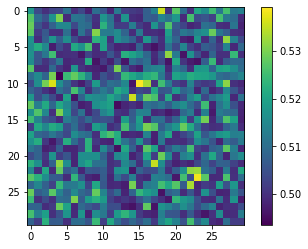

In [25]:
# 임의의 정규 분포를 따르는 입력 데이터 x를 생성합니다.
x = tf.random.normal([1,256,256,3])
# 임의의 균일 분포를 따르는 입력 데이터 y를 생성합니다.
y = tf.random.uniform([1,256,256,3])

# Discriminator 모델을 생성하고 x와 y를 입력으로 하여 출력 결과를 받습니다.
disc_out = Discriminator()(x, y)
# 출력 이미지를 시각화 합니다.
plt.imshow(disc_out[0, ... ,0])
# 컬러바를 함께 표시합니다.
plt.colorbar()

## 14-3. 학습하기

In [26]:
from tensorflow.keras import losses

# Binary Cross Entropy Loss 함수를 초기화합니다. from_logits=False로 설정하면
# 출력값이 확률로 해석되어 처리됩니다. 즉, generator와 discriminator의 출력이
# 시그모이드 활성화 함수를 거쳤다고 가정합니다.
bce = losses.BinaryCrossentropy(from_logits=False)
# 평균 절대 오차(Mean Absolute Error) Loss 함수를 초기화합니다. 
# 이는 생성된 이미지와 실제 이미지 간 픽셀 단위의 차이를 계산합니다.
mae = losses.MeanAbsoluteError()

# 생성자의 손실 함수를 정의합니다. 가짜 이미지(fake_output)와 실제 이미지(real_output) 간의 L1 손실과
# 가짜 이미지가 진짜로 분류될 확률에 대한 BCE 손실을 계산합니다.
def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)  # L1 손실을 계산합니다.
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)  # 생성자 손실을 계산합니다.
    return gene_loss, l1_loss

# 판별자의 손실 함수를 정의합니다. 가짜 이미지를 0으로 분류하는 BCE 손실과
# 진짜 이미지를 1로 분류하는 BCE 손실을 합산합니다.
def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


In [27]:
from tensorflow.keras import optimizers

# 생성자와 판별자를 위한 Adam 최적화 함수를 초기화합니다. 
# 베타1과 베타2 매개변수는 최적화 수행시 모멘텀에 영향을 줍니다.
gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅


In [28]:
# 학습 단계를 정의합니다. 이 함수는 스케치와 실제 채색 이미지를 받아
# 생성자와 판별자를 학습시킵니다.
@tf.function
def train_step(sketch, real_colored):

    # GradientTape을 사용해 생성자와 판별자의 학습 과정을 기록합니다.
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:

        # Generator 예측 - 생성자를 사용해 가짜 채색 이미지를 생성합니다.
        fake_colored = generator(sketch, training=True)
        
        # Discriminator 예측 - 판별자를 사용해 진짜 이미지와 가짜 이미지를 판별합니다.
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        
        # Generator 손실 계산 - 생성자와 판별자의 손실을 계산합니다.
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100

        # Discrminator 손실 계산 - 생성자와 판별자의 손실을 계산합니다.
        disc_loss = get_disc_loss(fake_disc, real_disc)

    # 손실 함수로부터 생성자와 판별자의 gradient를 계산합니다.
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # 계산된 gradient를 적용하여 생성자와 판별자의 가중치를 업데이트합니다.
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))

    # 생성자와 판별자의 손실 값을 반환합니다.
    return gene_loss, l1_loss, disc_loss


In [29]:
# 학습할 에포크 수를 설정합니다.
EPOCHS = 300

# UNet 구조의 생성자를 초기화합니다.
generator = UNetGenerator()
# 판별자를 초기화합니다.
discriminator = Discriminator()

# 에포크 수만큼 반복 학습을 수행합니다.
for epoch in range(1, EPOCHS+1):
    # 학습 데이터셋(train_images)을 순회하며 배치 단위로 학습을 수행합니다.
    for i, (sketch, colored) in enumerate(train_images):
        # 학습 단계를 실행하고 손실 값을 반환받습니다.
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 현재 손실 값을 출력합니다.
        if (i+1) % 100 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[100]                     
Generator_loss:0.5018                     
L1_loss:0.2013                     
Discriminator_loss:1.7565

EPOCH[1] - STEP[200]                     
Generator_loss:0.9292                     
L1_loss:0.1830                     
Discriminator_loss:1.2904

EPOCH[2] - STEP[100]                     
Generator_loss:1.3891                     
L1_loss:0.1723                     
Discriminator_loss:1.2490

EPOCH[2] - STEP[200]                     
Generator_loss:1.0604                     
L1_loss:0.1490                     
Discriminator_loss:0.7999

EPOCH[3] - STEP[100]                     
Generator_loss:1.1565                     
L1_loss:0.1785                     
Discriminator_loss:1.0471

EPOCH[3] - STEP[200]                     
Generator_loss:1.6569                     
L1_loss:0.1727                     
Discriminator_loss:0.7814

EPOCH[4] - STEP[100]                     
Generator_loss:0.7992                     
L1_loss:0.1683             

EPOCH[29] - STEP[100]                     
Generator_loss:1.6478                     
L1_loss:0.1787                     
Discriminator_loss:0.2829

EPOCH[29] - STEP[200]                     
Generator_loss:1.9183                     
L1_loss:0.1487                     
Discriminator_loss:0.8190

EPOCH[30] - STEP[100]                     
Generator_loss:1.5269                     
L1_loss:0.1714                     
Discriminator_loss:0.2834

EPOCH[30] - STEP[200]                     
Generator_loss:1.5956                     
L1_loss:0.1486                     
Discriminator_loss:0.5760

EPOCH[31] - STEP[100]                     
Generator_loss:2.0029                     
L1_loss:0.1386                     
Discriminator_loss:1.1799

EPOCH[31] - STEP[200]                     
Generator_loss:1.2392                     
L1_loss:0.1475                     
Discriminator_loss:0.8667

EPOCH[32] - STEP[100]                     
Generator_loss:1.2396                     
L1_loss:0.1747      

EPOCH[56] - STEP[200]                     
Generator_loss:2.6092                     
L1_loss:0.1976                     
Discriminator_loss:0.3705

EPOCH[57] - STEP[100]                     
Generator_loss:0.9606                     
L1_loss:0.1681                     
Discriminator_loss:0.5488

EPOCH[57] - STEP[200]                     
Generator_loss:1.3403                     
L1_loss:0.1681                     
Discriminator_loss:0.3369

EPOCH[58] - STEP[100]                     
Generator_loss:1.9951                     
L1_loss:0.1492                     
Discriminator_loss:1.3445

EPOCH[58] - STEP[200]                     
Generator_loss:1.8744                     
L1_loss:0.1379                     
Discriminator_loss:1.1188

EPOCH[59] - STEP[100]                     
Generator_loss:1.0501                     
L1_loss:0.1771                     
Discriminator_loss:0.4750

EPOCH[59] - STEP[200]                     
Generator_loss:1.7007                     
L1_loss:0.1711      

EPOCH[84] - STEP[100]                     
Generator_loss:0.8816                     
L1_loss:0.1493                     
Discriminator_loss:0.9705

EPOCH[84] - STEP[200]                     
Generator_loss:0.6340                     
L1_loss:0.1730                     
Discriminator_loss:1.0347

EPOCH[85] - STEP[100]                     
Generator_loss:1.2618                     
L1_loss:0.1877                     
Discriminator_loss:0.3499

EPOCH[85] - STEP[200]                     
Generator_loss:1.5024                     
L1_loss:0.1791                     
Discriminator_loss:0.2713

EPOCH[86] - STEP[100]                     
Generator_loss:1.2723                     
L1_loss:0.1787                     
Discriminator_loss:0.3442

EPOCH[86] - STEP[200]                     
Generator_loss:1.2125                     
L1_loss:0.1464                     
Discriminator_loss:0.8068

EPOCH[87] - STEP[100]                     
Generator_loss:1.8090                     
L1_loss:0.1774      

EPOCH[111] - STEP[200]                     
Generator_loss:1.1597                     
L1_loss:0.1772                     
Discriminator_loss:0.4326

EPOCH[112] - STEP[100]                     
Generator_loss:1.9354                     
L1_loss:0.1666                     
Discriminator_loss:1.8832

EPOCH[112] - STEP[200]                     
Generator_loss:1.4326                     
L1_loss:0.1474                     
Discriminator_loss:1.1685

EPOCH[113] - STEP[100]                     
Generator_loss:1.7794                     
L1_loss:0.1838                     
Discriminator_loss:0.4082

EPOCH[113] - STEP[200]                     
Generator_loss:1.2830                     
L1_loss:0.1582                     
Discriminator_loss:0.4610

EPOCH[114] - STEP[100]                     
Generator_loss:1.5212                     
L1_loss:0.2145                     
Discriminator_loss:0.2848

EPOCH[114] - STEP[200]                     
Generator_loss:1.0652                     
L1_loss:0.180

EPOCH[139] - STEP[100]                     
Generator_loss:0.8244                     
L1_loss:0.1470                     
Discriminator_loss:0.6881

EPOCH[139] - STEP[200]                     
Generator_loss:1.7324                     
L1_loss:0.1525                     
Discriminator_loss:0.6509

EPOCH[140] - STEP[100]                     
Generator_loss:1.0226                     
L1_loss:0.1549                     
Discriminator_loss:0.4760

EPOCH[140] - STEP[200]                     
Generator_loss:1.3772                     
L1_loss:0.1727                     
Discriminator_loss:0.3853

EPOCH[141] - STEP[100]                     
Generator_loss:1.9545                     
L1_loss:0.1606                     
Discriminator_loss:0.6105

EPOCH[141] - STEP[200]                     
Generator_loss:1.6987                     
L1_loss:0.1869                     
Discriminator_loss:0.3415

EPOCH[142] - STEP[100]                     
Generator_loss:1.6545                     
L1_loss:0.192

EPOCH[168] - STEP[200]                     
Generator_loss:0.4374                     
L1_loss:0.1742                     
Discriminator_loss:1.6207

EPOCH[169] - STEP[100]                     
Generator_loss:1.3581                     
L1_loss:0.1692                     
Discriminator_loss:0.3486

EPOCH[169] - STEP[200]                     
Generator_loss:1.8463                     
L1_loss:0.1480                     
Discriminator_loss:1.3115

EPOCH[170] - STEP[100]                     
Generator_loss:1.5490                     
L1_loss:0.1348                     
Discriminator_loss:1.3810

EPOCH[170] - STEP[200]                     
Generator_loss:1.1991                     
L1_loss:0.1323                     
Discriminator_loss:1.2555

EPOCH[171] - STEP[100]                     
Generator_loss:1.1809                     
L1_loss:0.1760                     
Discriminator_loss:0.4259

EPOCH[171] - STEP[200]                     
Generator_loss:1.8502                     
L1_loss:0.158

EPOCH[196] - STEP[100]                     
Generator_loss:1.6753                     
L1_loss:0.1301                     
Discriminator_loss:1.2167

EPOCH[196] - STEP[200]                     
Generator_loss:2.0331                     
L1_loss:0.1583                     
Discriminator_loss:1.1076

EPOCH[197] - STEP[100]                     
Generator_loss:1.4895                     
L1_loss:0.1745                     
Discriminator_loss:0.2903

EPOCH[197] - STEP[200]                     
Generator_loss:1.6878                     
L1_loss:0.1780                     
Discriminator_loss:0.2151

EPOCH[198] - STEP[100]                     
Generator_loss:2.2553                     
L1_loss:0.1671                     
Discriminator_loss:0.3694

EPOCH[198] - STEP[200]                     
Generator_loss:0.8048                     
L1_loss:0.1604                     
Discriminator_loss:0.8922

EPOCH[199] - STEP[100]                     
Generator_loss:1.6046                     
L1_loss:0.163

EPOCH[223] - STEP[200]                     
Generator_loss:1.1948                     
L1_loss:0.1627                     
Discriminator_loss:0.9042

EPOCH[224] - STEP[100]                     
Generator_loss:1.1624                     
L1_loss:0.1553                     
Discriminator_loss:0.4168

EPOCH[224] - STEP[200]                     
Generator_loss:1.4699                     
L1_loss:0.1877                     
Discriminator_loss:0.2901

EPOCH[225] - STEP[100]                     
Generator_loss:0.9037                     
L1_loss:0.1468                     
Discriminator_loss:1.0480

EPOCH[225] - STEP[200]                     
Generator_loss:1.0175                     
L1_loss:0.1730                     
Discriminator_loss:0.7328

EPOCH[226] - STEP[100]                     
Generator_loss:1.1100                     
L1_loss:0.1651                     
Discriminator_loss:0.5948

EPOCH[226] - STEP[200]                     
Generator_loss:1.9391                     
L1_loss:0.136

EPOCH[251] - STEP[100]                     
Generator_loss:1.4411                     
L1_loss:0.1469                     
Discriminator_loss:1.0198

EPOCH[251] - STEP[200]                     
Generator_loss:2.1966                     
L1_loss:0.1927                     
Discriminator_loss:0.1797

EPOCH[252] - STEP[100]                     
Generator_loss:1.7756                     
L1_loss:0.1764                     
Discriminator_loss:0.2048

EPOCH[252] - STEP[200]                     
Generator_loss:1.1808                     
L1_loss:0.1930                     
Discriminator_loss:0.4066

EPOCH[253] - STEP[100]                     
Generator_loss:1.2619                     
L1_loss:0.1443                     
Discriminator_loss:0.8504

EPOCH[253] - STEP[200]                     
Generator_loss:1.2492                     
L1_loss:0.1605                     
Discriminator_loss:0.3878

EPOCH[254] - STEP[100]                     
Generator_loss:1.4219                     
L1_loss:0.128

EPOCH[278] - STEP[200]                     
Generator_loss:1.1409                     
L1_loss:0.1569                     
Discriminator_loss:1.5273

EPOCH[279] - STEP[100]                     
Generator_loss:0.7949                     
L1_loss:0.1946                     
Discriminator_loss:0.6841

EPOCH[279] - STEP[200]                     
Generator_loss:1.1895                     
L1_loss:0.1461                     
Discriminator_loss:0.7575

EPOCH[280] - STEP[100]                     
Generator_loss:1.1706                     
L1_loss:0.1868                     
Discriminator_loss:0.4096

EPOCH[280] - STEP[200]                     
Generator_loss:2.0498                     
L1_loss:0.1766                     
Discriminator_loss:0.2311

EPOCH[281] - STEP[100]                     
Generator_loss:1.2886                     
L1_loss:0.1784                     
Discriminator_loss:0.3510

EPOCH[281] - STEP[200]                     
Generator_loss:1.5005                     
L1_loss:0.138

In [52]:
# 학습 루프가 끝난 후에 모델을 저장합니다.
generator.save('generator_model', save_format='tf')  # 생성자 모델 저장
discriminator.save('discriminator_model', save_format='tf')  # 판별자 모델 저장

# 가중치만 저장합니다.
generator.save_weights('generator_weights.h5')
discriminator.save_weights('discriminator_weights.h5')

INFO:tensorflow:Assets written to: generator_model/assets


INFO:tensorflow:Assets written to: generator_model/assets


INFO:tensorflow:Assets written to: discriminator_model/assets


INFO:tensorflow:Assets written to: discriminator_model/assets


## 14-4. 시각화하기!

In [53]:
# 모델 학습시 history를 저장해주지 않아서 로스값을 모두 text파일로 만들어줬습니다.
# 결과를 저장할 딕셔너리를 초기화합니다.
loss_history = {}

# 빈 리스트를 초기화합니다.
lines = []

# 'with' 문을 사용하여 파일을 엽니다. 이렇게 하면 파일을 자동으로 닫을 수 있습니다.
with open('loss_log.txt', 'r') as file:
    # 파일의 각 줄을 순회합니다.
    for line in file:
        # 줄바꿈 문자를 제거하고 리스트에 추가합니다.
        lines.append(line.strip())

# 리스트의 내용을 출력하여 확인합니다.
print(lines[:5])

['EPOCH[1] - STEP[100]', 'Generator_loss:0.5018', 'L1_loss:0.2013', 'Discriminator_loss:1.7565', '']


In [41]:
print(len(lines))

2979


In [55]:
history = {'gen_loss':[], 'l1_loss':[], 'disc_loss':[]}

for i in range(len(lines)//5):
    history['gen_loss'].append(float(lines[i*5+1][15:]))
    history['l1_loss'].append(float(lines[i*5+2][8:]))
    history['disc_loss'].append(float(lines[i*5+3][19:]))
    
print(history['gen_loss'][:5])
print(history['l1_loss'][:5])
print(history['disc_loss'][:5])

[0.5018, 0.9292, 1.3891, 1.0604, 1.1565]
[0.2013, 0.183, 0.1723, 0.149, 0.1785]
[1.7565, 1.2904, 1.249, 0.7999, 1.0471]


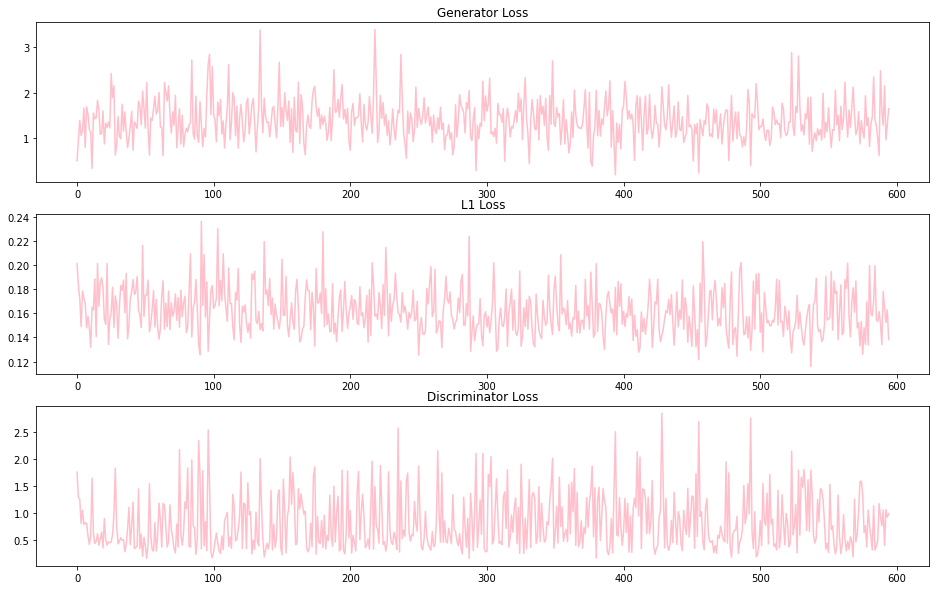

In [63]:
import matplotlib.pyplot as plt

# 각 epoch에 따른 학습 결과를 시각화
plt.figure(figsize=(16,10))

plt.subplot(311)
plt.plot(history['gen_loss'], color = 'pink')
plt.title('Generator Loss')

plt.subplot(312)
plt.plot(history['l1_loss'], color = 'pink')
plt.title('L1 Loss')

plt.subplot(313)
plt.plot(history['disc_loss'], color = 'pink')
plt.title('Discriminator Loss')


plt.show()

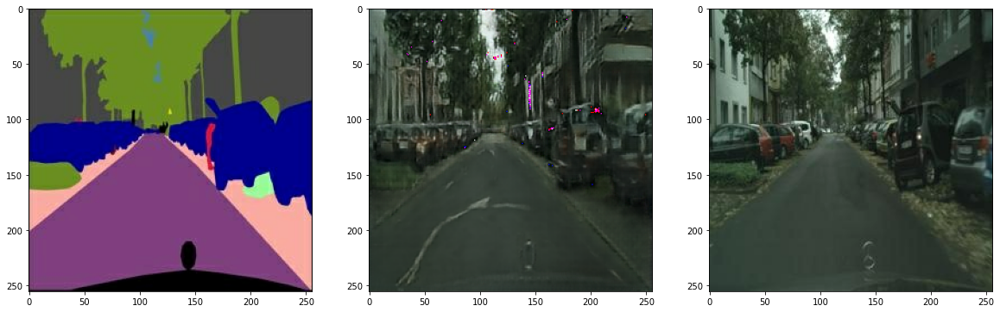

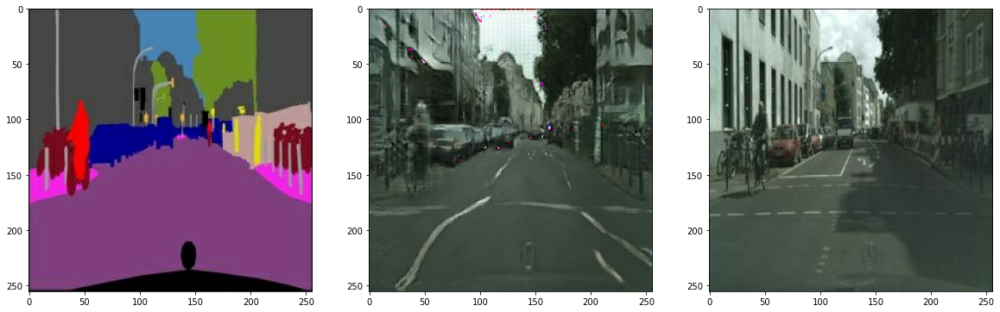

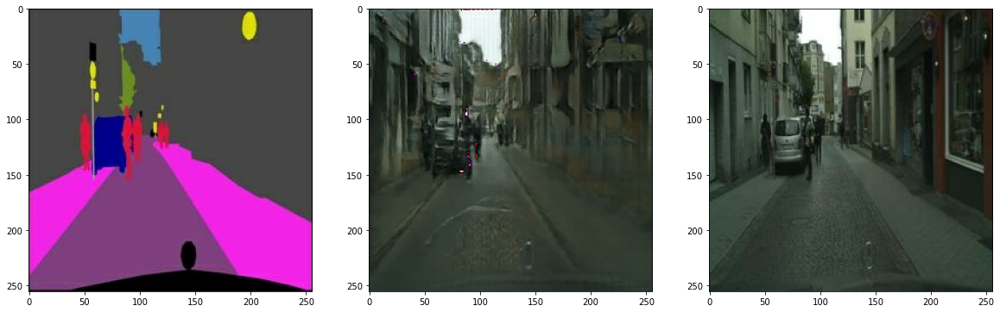

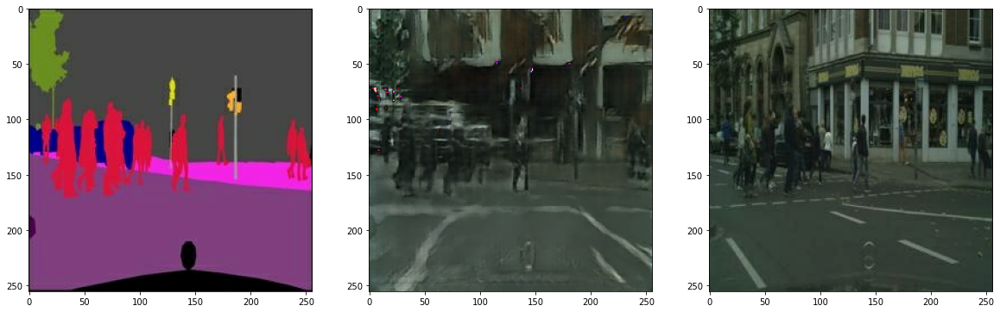

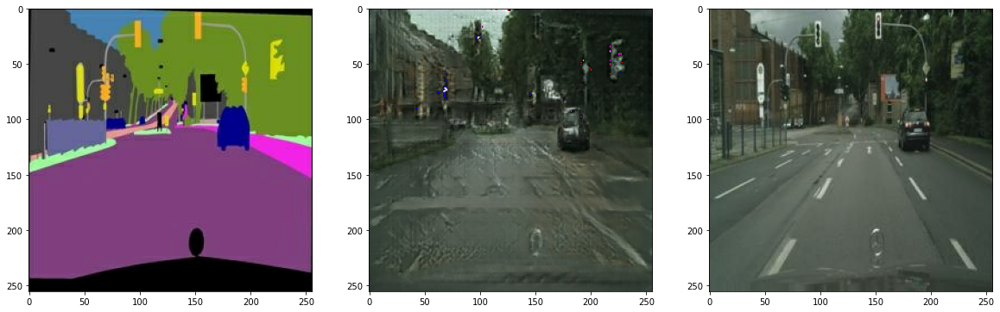

...

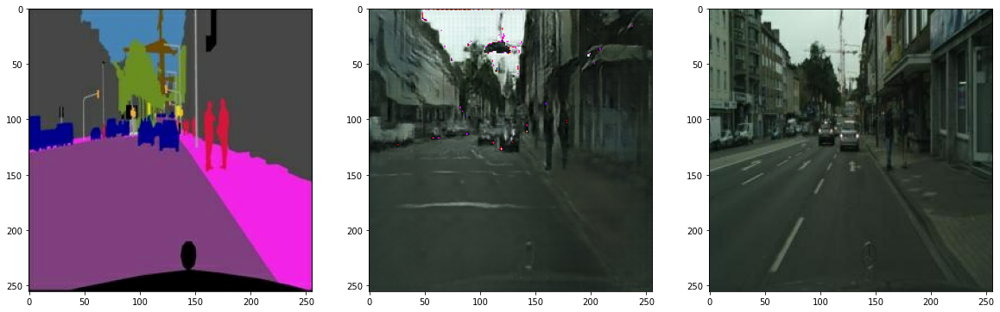

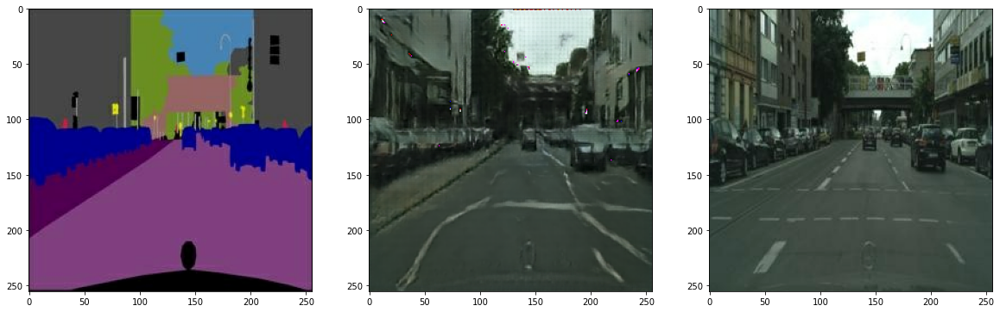

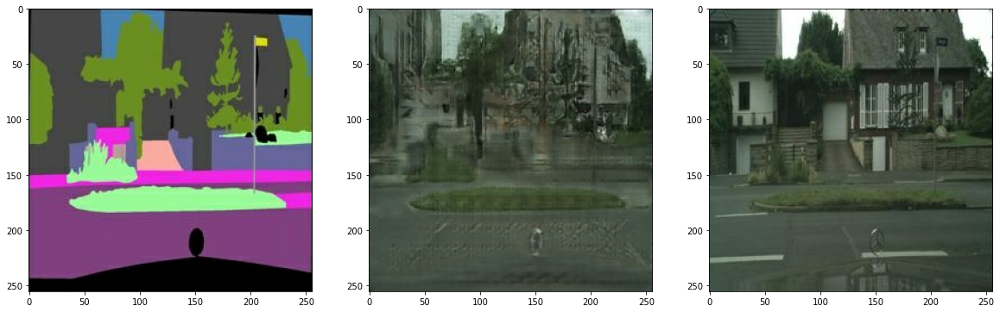

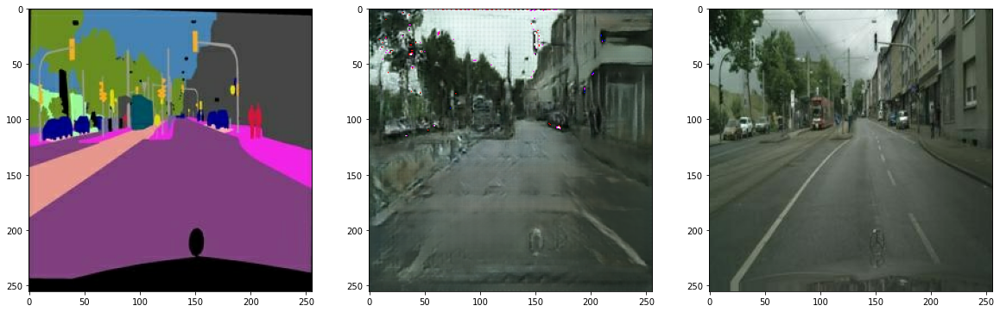

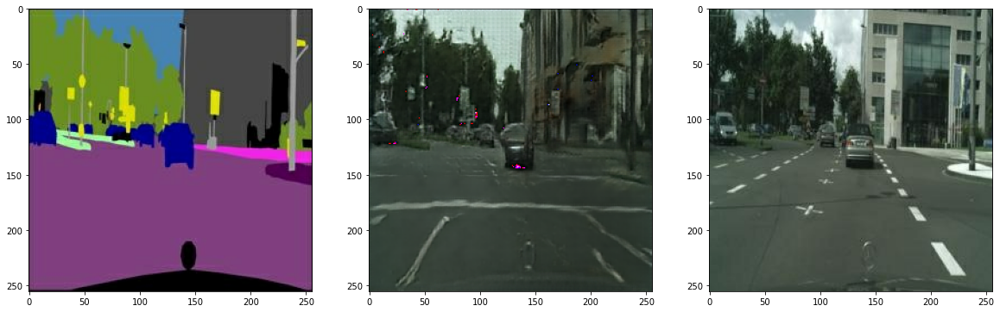

In [48]:
# test셋으로 이미지 생성 결과
for i in range(15) : 
  test_ind = i

  f = data_path + os.listdir(data_path)[test_ind]
  sketch, colored = load_img(f)

  pred = generator(tf.expand_dims(sketch, 0))
  pred = denormalize(pred)

  plt.figure(figsize=(20,10))
  plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
  plt.subplot(1,3,2); plt.imshow(pred[0])
  plt.subplot(1,3,3); plt.imshow(denormalize(colored))

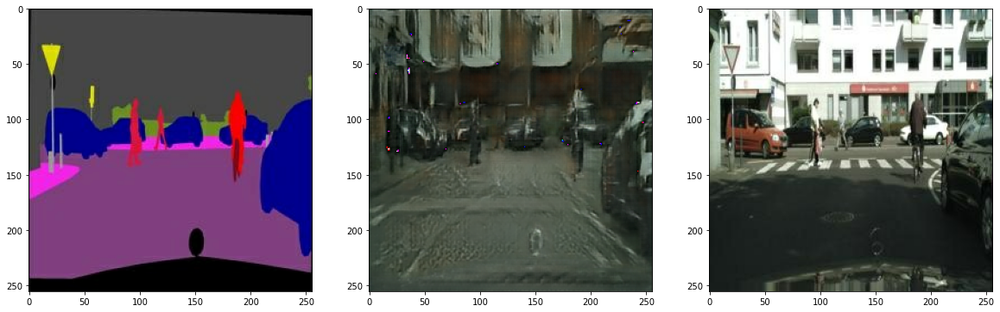

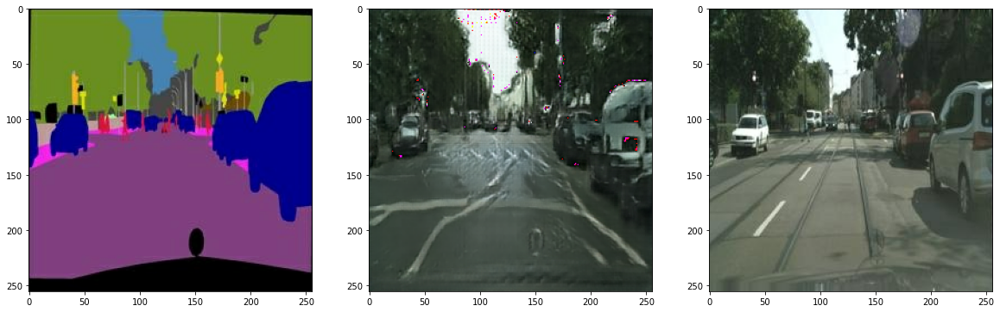

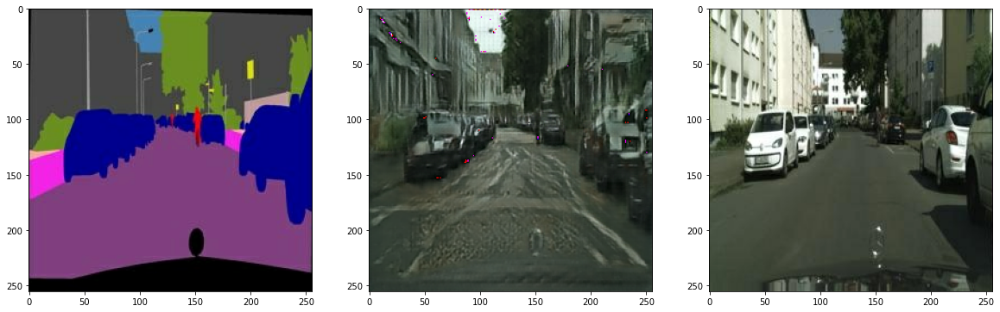

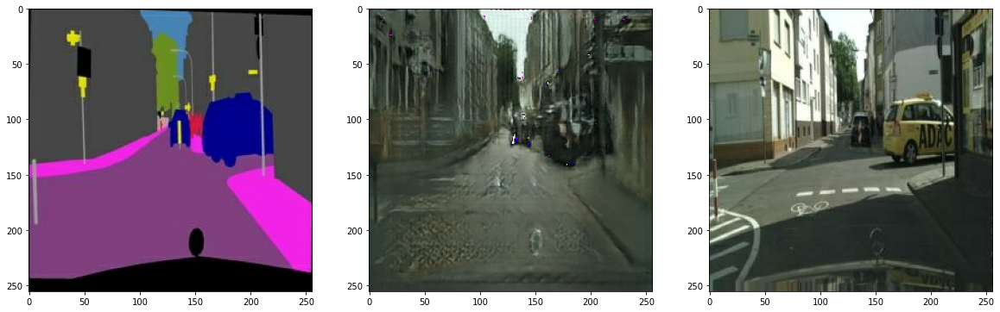

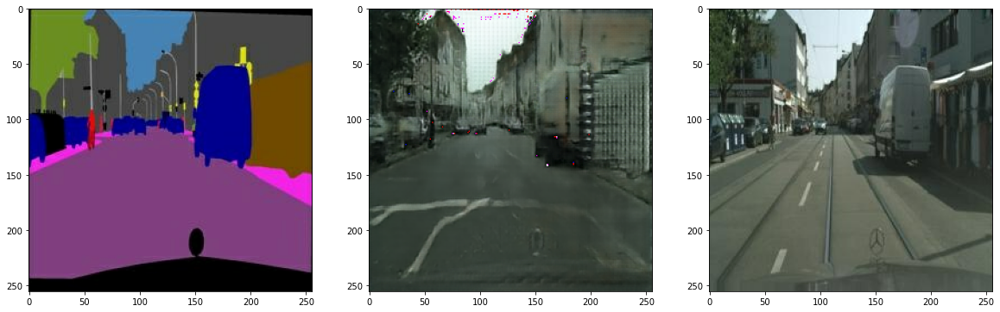

In [49]:
# 검증용 데이터 출력
for i in range(5) : 
  test_ind = i

  f = data_path_val + os.listdir(data_path_val)[test_ind]
  sketch, colored = load_img(f)

  pred = generator(tf.expand_dims(sketch, 0))
  pred = denormalize(pred)

  plt.figure(figsize=(20,10))
  plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
  plt.subplot(1,3,2); plt.imshow(pred[0])
  plt.subplot(1,3,3); plt.imshow(denormalize(colored))

### 회고 : 

    본 프로젝트는 단순화된 이미지를 바탕으로 실제 이미지를 생성하여 출력해보는 프로젝트였습니다.
    실제 사진과 segmentation 이미지를 입력으로 받아서 학습을 하고 학습한 모델에 segmentation 이미지를 입력하면, 
    실제와 유사한 이미지를 출력하도록 학습을 진행하였고, 이 과정에서 GAN과 cGAN 에 대해 학습하고, pix2pix를 사용하는 방법에 대해 배웠습니다.

    모델 학습시에는 충분하다고 생각했던 300 EPOCH을 돌렸음에도 엄청나게 성능이 향상된것을 느끼지 못하였고, 
    이를 통해, 다음에는 500 EPOCH까지 늘려서 시도해 보아야겠다는 생각을 했습니다.

    로그값은 모델 돌릴 때 반드시 history에 담아야겠다고 다짐했습니다.
    시각화 과정에 반드시 필요한 로스 값이 없어서 많이 당황했지만, 
    출력값에 있는 로그를 바탕으로 txt 파일을 만들어서 문제를 해결 할 수 있었습니다.

### 프로젝트 수행
---
프로젝트를 진행하면서 필수로 수행해야 할 사항은 다음과 같습니다.

1. 데이터에 한 가지 이상의 augmentation 방법을 적용하여 학습해 주세요.
(어떠한 방법을 사용했는지 적어주세요.)

2. 이전에 구현했던 두 개의 Generator 중 Encoder와 Decoder간에 skip connection이 있는 U-Net Generator를 사용해 주세요.

3. 모델 학습 후, 학습된 Generator를 이용해 테스트합니다. 테스트 데이터는 다운로드했던 "val" 폴더 내 이미지를 사용해 주세요.

4. 1개 이상의 이미지에 대해 테스트 과정을 거친 후 그 결과를 스케치, 생성된 사진, 실제 사진 순서로 나란히 시각화해 주세요.

5. 모델을 충분히 학습하기에 시간이 부족할 수 있습니다. 적어도 10 epoch 이상 학습하며 중간 손실 값에 대한 로그를 남겨주세요. 좋은 결과를 얻기 위해선 긴 학습 시간이 필요하므로 테스트 결과는 만족스럽지 않아도 괜찮습니다.

아래의 기준을 바탕으로 프로젝트를 평가합니다.
평가문항	
1. pix2pix 모델 학습을 위해 필요한 데이터셋을 적절히 구축하였다.	
상세기준 : 데이터 분석 과정 및 한 가지 이상의 augmentation을 포함한 데이터셋 구축 과정이 체계적으로 제시되었다.

2. pix2pix 모델을 구현하여 성공적으로 학습 과정을 진행하였다.	 
상세기준 : U-Net generator,discriminator 모델 구현이 완료되어 train_step의 output을 확인하고 개선하였다.

3. 학습 과정 및 테스트에 대한 시각화 결과를 제출하였다.	
상세기준 : 10 epoch 이상의 학습을 진행한 후 최종 테스트 결과에서 진행한 epoch 수에 걸맞은 정도의 품질을 확인하였다.